In [1]:
import os
import argparse
import cv2 as cv
import time
import multiprocessing as mp
#from picamera import PiCamera

from utilities import *

In [2]:
def detect_bottle(img):
    t_start_det = time.time()
    hsv_min = np.array([0, 26, 116])
    hsv_max = np.array([178, 54, 166])
    #brick_mask = HSV_mask(img, hsv_min, hsv_max)
    
    
    """"""
    ### IMPORTANT
    beacon_hsv_min = np.array([70, 100, 200])
    beacon_hsv_max = np.array([180, 255, 255])
    beacon_mask = HSV_mask(img, beacon_hsv_min, beacon_hsv_max)
    plt.imshow(beacon_mask)
    plt.show()
    ###
    
    img_out = img.copy()
    """
    rectangles = find_rectangles_around_brick(brick_mask)
    for rect in rectangles:
        #print(rect)
        x1, x2, y1, y2 = rect
        cv.rectangle(img_out, (x2, x1), (y2, y1), (255, 0, 0), 3)
    """
    ROI = img[200:, 0:]
    #print(np.shape(ROI))
    img_gray = cv.cvtColor(ROI, cv.COLOR_BGR2GRAY)
    foundCorner, corners = corner_detection(img_gray)
    print("corners", corners)
    
    img_corners = img.copy()
    for c in corners:
        x = c[0][0]
        y = c[0][1]
        cv.circle(img_corners, (x, y), 10, [0,255,0], -1)
    print("detected corners")
    plt.imshow(img_corners)
    plt.show()
    
        
    # Try to exclude outliers
    cornerList = []
    for i in range(len(corners)):
        c = corners[i].flatten()
        
        isBrick = False
        """"""
        isBeacon = False
        """
        for rect in rectangles:
            if corner_in_rectangle(rect, c):
                isBrick = True  # corner lies inside a rectangle describing a brick
                break
        """
        ### IMPORTANT
        if corner_in_beacon(beacon_mask, c):
            isBeacon = True
        ###
        #print("isBeacon:", isBeacon)
        
        if  not isBeacon:
            min_neighbours = 6  # minimum amount of neighbours
            max_distance = 100  # distance in pixels within the corner must have its neighbours
            isOutlier = corner_is_outlier(corners, i, min_neighbours, max_distance)
            
        """"""
        if not isBeacon and not isOutlier:
            
            cornerList.append(c)

    # TODO add the case where there are more than 1 bottle in the image!

    # Plot a bounding box around the bottle
    has_bottle, center, img_out = add_corners(img_out, cornerList)
    
    if (has_bottle):
        print("[DETECTION] Found a bottle at position ", center)
    else:
        print("[DETECTION] Found no bottle ...")

    t_stop_det = time.time()
    print("[DETECTION] detection time: ", t_stop_det - t_start_det, "seconds")
    return has_bottle, center, img_out


images/noIR/image3.jpg


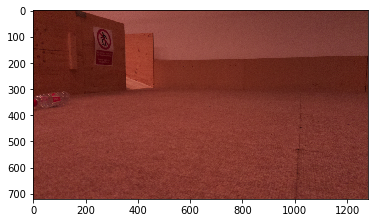

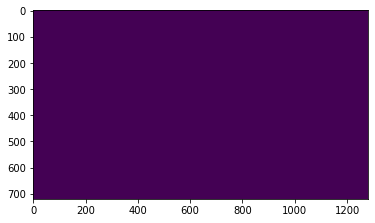

corners [[[ 13. 331.]]

 [[ 27. 333.]]

 [[ 58. 321.]]

 [[ 17. 342.]]

 [[112. 314.]]

 [[ 73. 356.]]

 [[ 37. 367.]]

 [[ 40. 321.]]

 [[356. 256.]]

 [[609. 214.]]]
detected corners


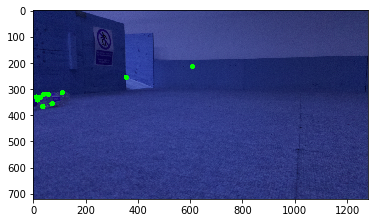

neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 0
neighbours 0
[DETECTION] Found a bottle at position  [ 62 340]
[DETECTION] detection time:  0.43549680709838867 seconds


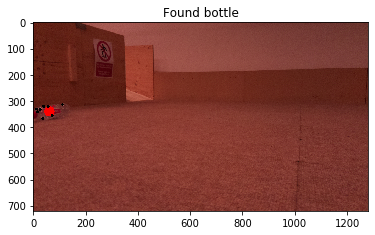

In [3]:
i = 1
while i < 2:
    img_name = "images/noIR/image3.jpg"
    print(img_name)
    plt.imshow(plt.imread(img_name))
    plt.show()
    img = cv.imread(img_name)
    #plt.imshow(img)
    #plt.show()
    has_bottle, center, img_out = detect_bottle(img)

    img_out = cv.cvtColor(img_out, cv.COLOR_BGR2RGB)

    plt.figure()
    if has_bottle:
        plt.title("Found bottle")
    else:
        plt.title("No bottle found")
    plt.imshow(img_out)
    plt.show()
    i += 1


images/noIR/image1.jpg


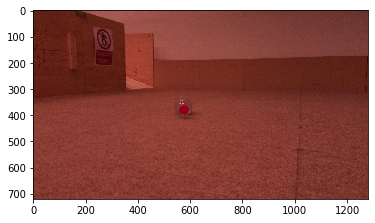

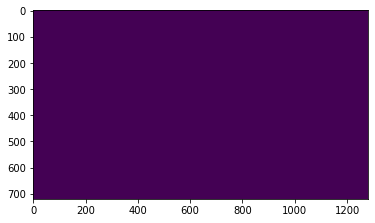

corners [[[ 566.  354.]]

 [[ 588.  345.]]

 [[ 573.  344.]]

 [[ 559.  346.]]

 [[ 595.  390.]]

 [[ 609.  214.]]

 [[ 356.  256.]]

 [[1089.  425.]]]
detected corners


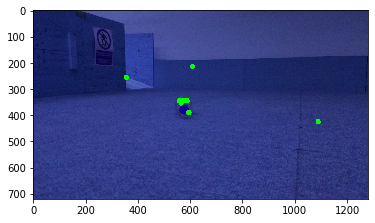

neighbours 4
neighbours 4
neighbours 4
neighbours 4
neighbours 4
neighbours 0
neighbours 0
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5363569259643555 seconds


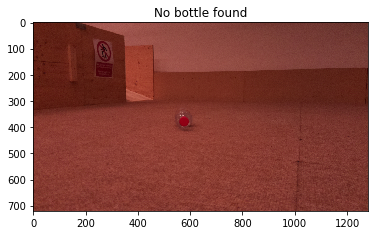

images/noIR/image2.jpg


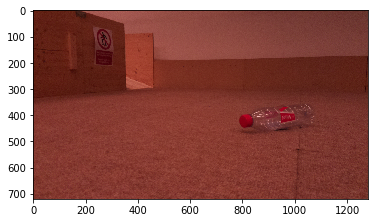

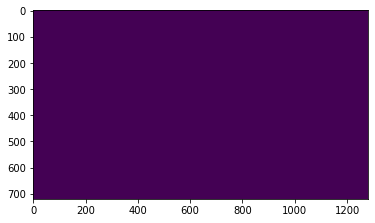

corners [[[1026.  367.]]

 [[1051.  367.]]

 [[1000.  371.]]

 [[ 864.  397.]]

 [[ 891.  397.]]

 [[ 943.  426.]]

 [[ 864.  386.]]

 [[1063.  407.]]

 [[ 855.  405.]]

 [[ 898.  420.]]]
detected corners


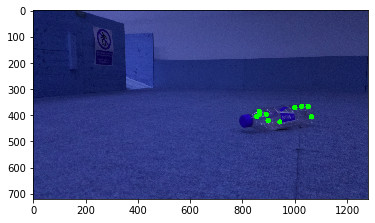

neighbours 3
neighbours 3
neighbours 4
neighbours 5
neighbours 5
neighbours 6
neighbours 5
neighbours 3
neighbours 5
neighbours 5
[DETECTION] Found a bottle at position  [943 426]
[DETECTION] detection time:  0.669741153717041 seconds


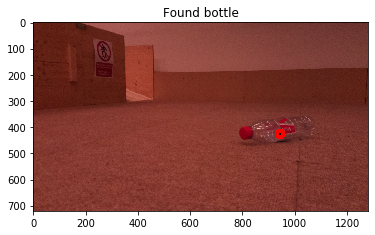

images/noIR/image3.jpg


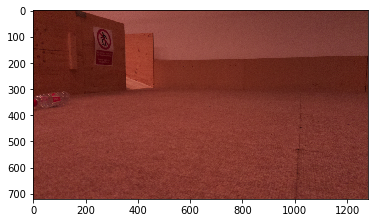

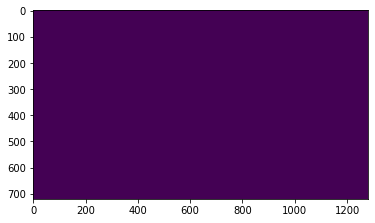

corners [[[ 13. 331.]]

 [[ 27. 333.]]

 [[ 58. 321.]]

 [[ 17. 342.]]

 [[112. 314.]]

 [[ 73. 356.]]

 [[ 37. 367.]]

 [[ 40. 321.]]

 [[356. 256.]]

 [[609. 214.]]]
detected corners


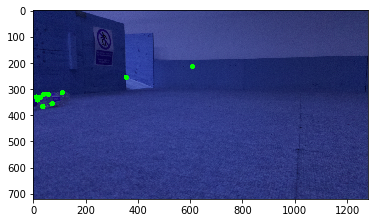

neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 0
neighbours 0
[DETECTION] Found a bottle at position  [ 62 340]
[DETECTION] detection time:  0.5942349433898926 seconds


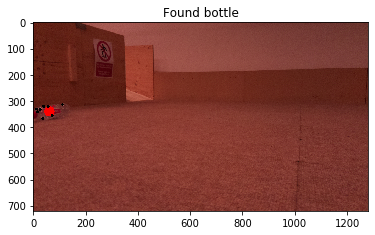

images/noIR/image4.jpg


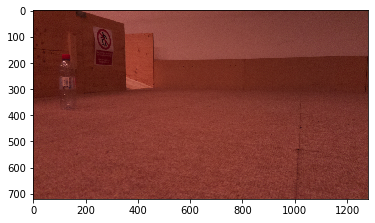

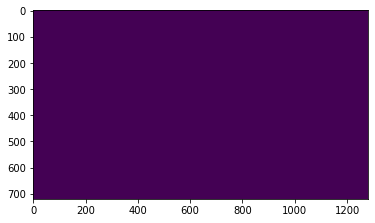

corners [[[117. 208.]]

 [[125. 214.]]

 [[106. 211.]]

 [[119. 320.]]

 [[138. 213.]]

 [[117. 290.]]

 [[133. 290.]]

 [[131. 360.]]

 [[356. 256.]]

 [[104. 228.]]]
detected corners


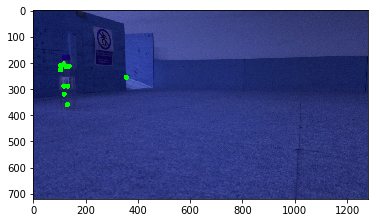

neighbours 6
neighbours 6
neighbours 6
neighbours 4
neighbours 6
neighbours 8
neighbours 8
neighbours 3
neighbours 0
neighbours 7
[DETECTION] Found a bottle at position  [121 249]
[DETECTION] detection time:  0.6091837882995605 seconds


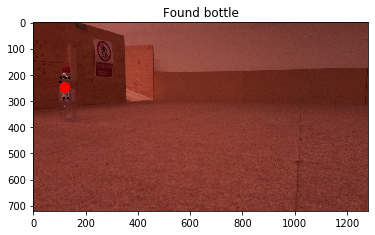

images/noIR/image5.jpg


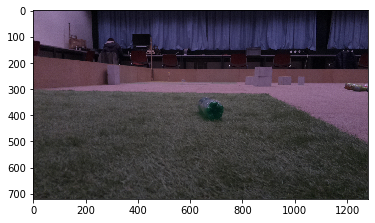

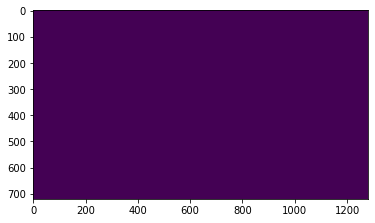

corners [[[ 750.  211.]]

 [[ 331.  206.]]

 [[ 496.  214.]]

 [[ 375.  203.]]

 [[1130.  207.]]

 [[ 817.  211.]]

 [[ 450.  204.]]

 [[1276.  288.]]

 [[ 983.  211.]]

 [[ 913.  211.]]]
detected corners


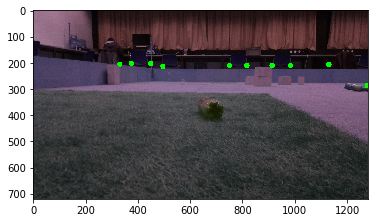

neighbours 1
neighbours 1
neighbours 1
neighbours 2
neighbours 0
neighbours 2
neighbours 2
neighbours 0
neighbours 1
neighbours 2
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6213037967681885 seconds


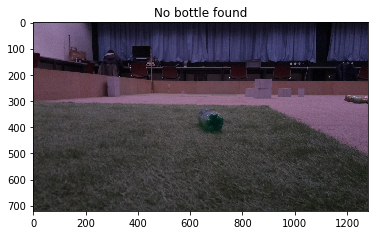

images/noIR/image6.jpg


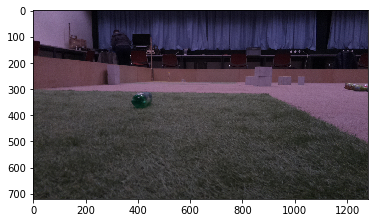

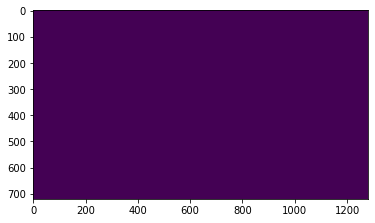

corners [[[ 750.  211.]]

 [[ 496.  214.]]

 [[ 449.  204.]]

 [[1130.  207.]]

 [[ 376.  203.]]

 [[ 817.  211.]]

 [[1276.  288.]]

 [[ 415.  325.]]

 [[ 913.  211.]]

 [[ 980.  214.]]]
detected corners


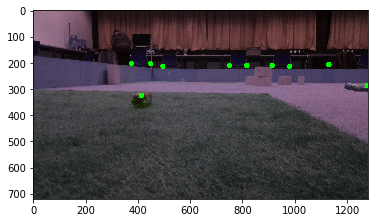

neighbours 1
neighbours 1
neighbours 2
neighbours 0
neighbours 1
neighbours 2
neighbours 0
neighbours 0
neighbours 2
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.4400200843811035 seconds


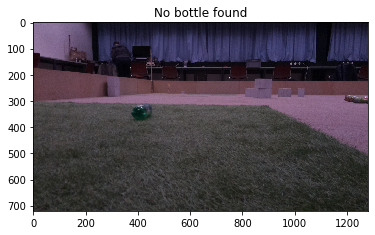

images/noIR/image7.jpg


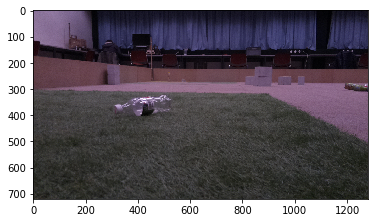

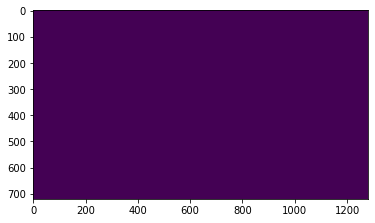

corners [[[ 331.  205.]]

 [[ 750.  211.]]

 [[ 496.  213.]]

 [[1131.  207.]]

 [[ 375.  203.]]

 [[ 817.  211.]]

 [[ 495.  335.]]

 [[ 449.  204.]]

 [[ 415.  392.]]

 [[1276.  288.]]]
detected corners


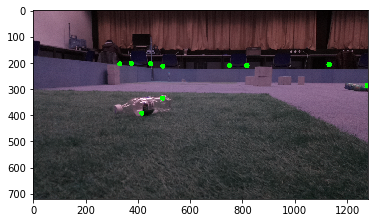

neighbours 1
neighbours 1
neighbours 1
neighbours 0
neighbours 2
neighbours 1
neighbours 1
neighbours 2
neighbours 1
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5084810256958008 seconds


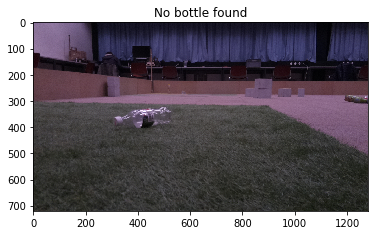

images/noIR/image8.jpg


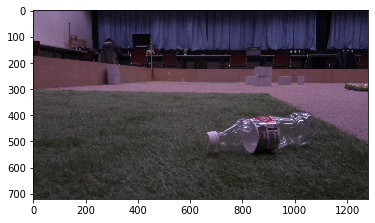

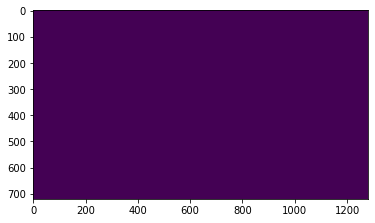

corners [[[1032.  420.]]

 [[ 331.  205.]]

 [[ 750.  210.]]

 [[1011.  406.]]

 [[ 990.  408.]]

 [[1004.  398.]]

 [[ 997.  428.]]

 [[ 496.  213.]]

 [[1013.  427.]]

 [[ 863.  444.]]]
detected corners


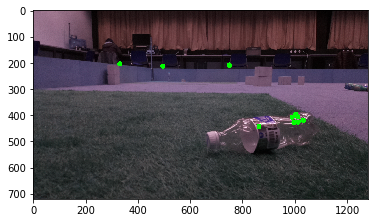

neighbours 5
neighbours 0
neighbours 0
neighbours 5
neighbours 5
neighbours 5
neighbours 5
neighbours 0
neighbours 5
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5506670475006104 seconds


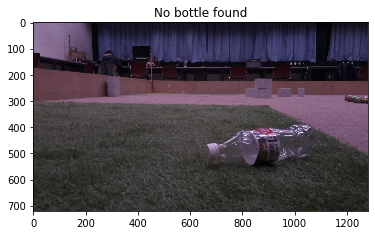

images/noIR/image9.jpg


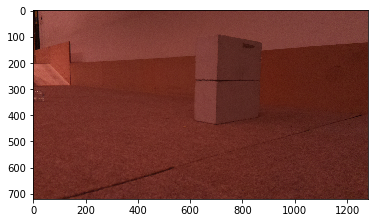

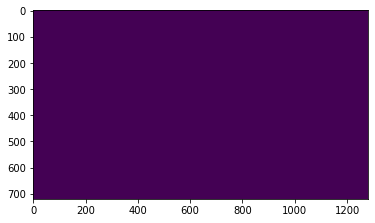

corners [[[ 16. 309.]]

 [[ 31. 317.]]

 [[ 36. 336.]]

 [[ 10. 335.]]

 [[ 22. 336.]]

 [[140. 285.]]

 [[988. 443.]]

 [[871. 201.]]

 [[141. 203.]]]
detected corners


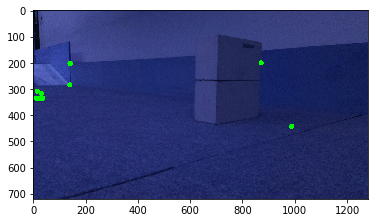

neighbours 4
neighbours 4
neighbours 4
neighbours 4
neighbours 4
neighbours 1
neighbours 0
neighbours 0
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6574883460998535 seconds


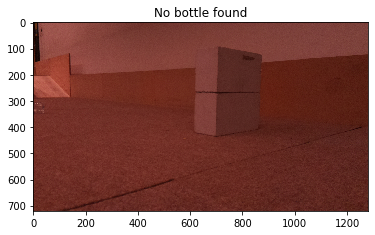

images/noIR/image10.jpg


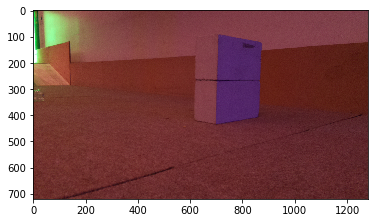

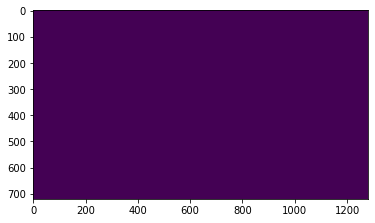

corners [[[ 19. 302.]]

 [[ 10. 335.]]

 [[ 31. 317.]]

 [[ 36. 336.]]

 [[ 22. 336.]]

 [[  9. 311.]]

 [[140. 285.]]

 [[989. 443.]]

 [[108. 331.]]

 [[141. 202.]]]
detected corners


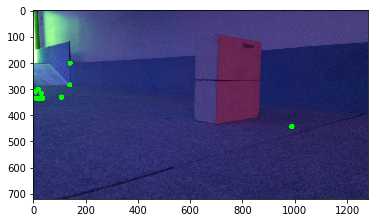

neighbours 6
neighbours 6
neighbours 6
neighbours 6
neighbours 6
neighbours 5
neighbours 2
neighbours 0
neighbours 6
neighbours 1
[DETECTION] Found a bottle at position  [ 59 319]
[DETECTION] detection time:  0.6573898792266846 seconds


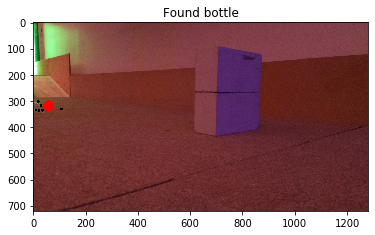

images/noIR/image11.jpg


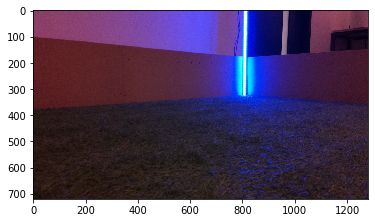

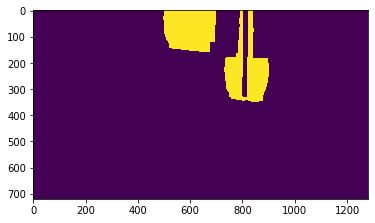

corners [[[835. 329.]]

 [[823. 330.]]

 [[804. 324.]]

 [[816. 322.]]

 [[779. 330.]]

 [[794. 327.]]

 [[908. 471.]]

 [[681. 205.]]

 [[605. 202.]]

 [[811. 468.]]]
detected corners


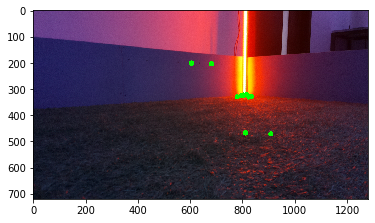

neighbours 5
neighbours 5
neighbours 1
neighbours 1
neighbours 1
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5872600078582764 seconds


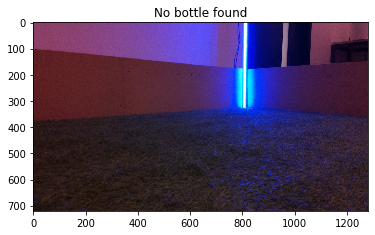

images/noIR/image12.jpg


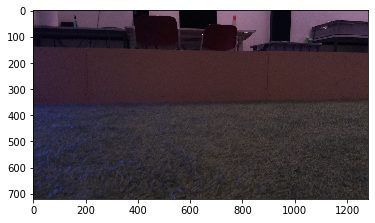

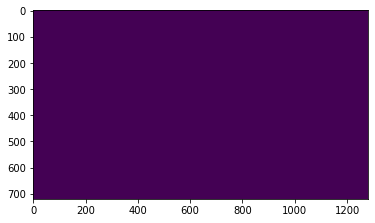

corners [[[1139.  562.]]

 [[1245.  497.]]

 [[1270.  469.]]

 [[1119.  472.]]

 [[1258.  468.]]

 [[1045.  387.]]

 [[1238.  392.]]

 [[1064.  437.]]

 [[ 935.  539.]]

 [[1207.  454.]]]
detected corners


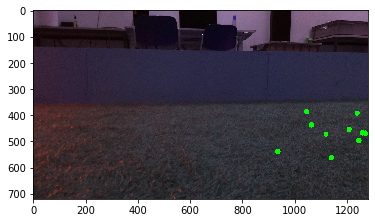

neighbours 1
neighbours 3
neighbours 4
neighbours 3
neighbours 4
neighbours 1
neighbours 3
neighbours 2
neighbours 0
neighbours 5
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5851099491119385 seconds


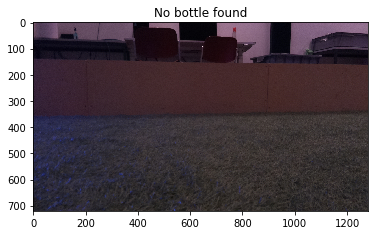

images/noIR/image13.jpg


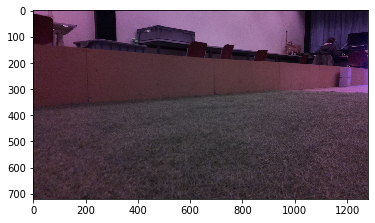

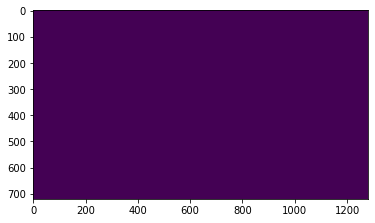

corners [[[1204.  210.]]

 [[1181.  420.]]

 [[1145.  560.]]

 [[ 922.  549.]]

 [[1036.  499.]]

 [[1166.  642.]]

 [[1089.  574.]]

 [[1204.  419.]]

 [[1140.  495.]]

 [[1157.  546.]]]
detected corners


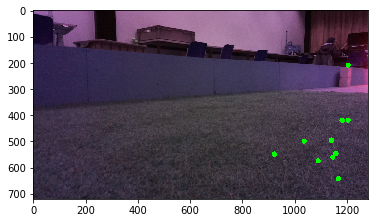

neighbours 0
neighbours 2
neighbours 4
neighbours 0
neighbours 1
neighbours 2
neighbours 4
neighbours 2
neighbours 5
neighbours 4
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6429266929626465 seconds


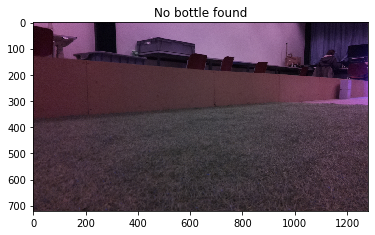

images/noIR/image14.jpg


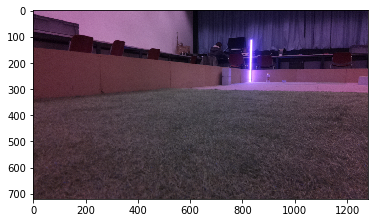

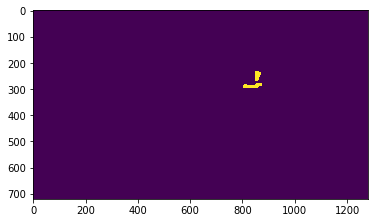

corners [[[1137.  209.]]

 [[ 748.  212.]]

 [[ 818.  211.]]

 [[1218.  208.]]

 [[ 856.  218.]]

 [[ 921.  214.]]

 [[1055.  305.]]

 [[ 896.  244.]]

 [[ 832.  274.]]

 [[1175.  310.]]]
detected corners


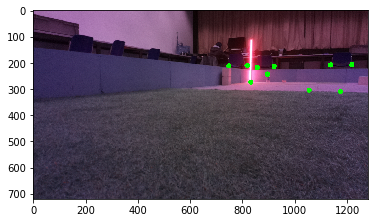

neighbours 1
neighbours 1
neighbours 4
neighbours 1
neighbours 4
neighbours 2
neighbours 0
neighbours 4
neighbours 3
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6298749446868896 seconds


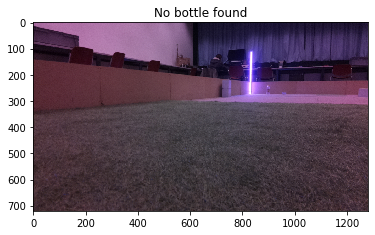

images/noIR/image15.jpg


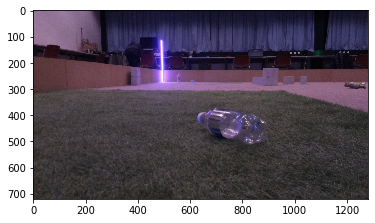

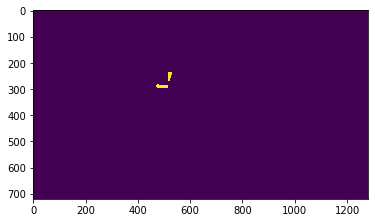

corners [[[ 764.  215.]]

 [[ 412.  211.]]

 [[ 369.  214.]]

 [[1123.  209.]]

 [[ 815.  422.]]

 [[ 733.  415.]]

 [[ 811.  411.]]

 [[1263.  281.]]

 [[ 881.  428.]]

 [[ 828.  215.]]]
detected corners


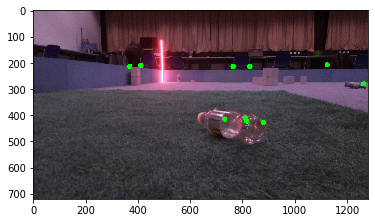

neighbours 1
neighbours 1
neighbours 1
neighbours 0
neighbours 3
neighbours 2
neighbours 3
neighbours 0
neighbours 2
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.5507001876831055 seconds


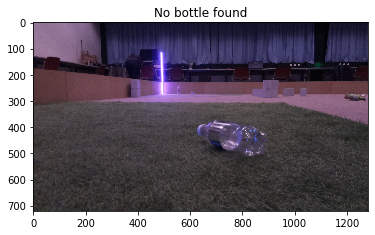

images/noIR/image16.jpg


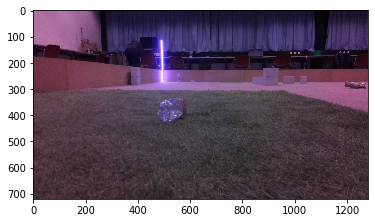

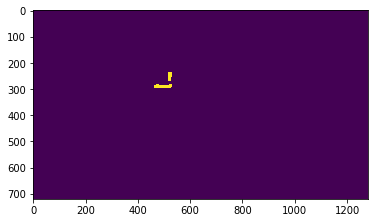

corners [[[ 764.  215.]]

 [[ 370.  213.]]

 [[ 412.  211.]]

 [[1123.  209.]]

 [[1263.  280.]]

 [[ 522.  220.]]

 [[ 918.  214.]]

 [[ 482.  211.]]

 [[ 828.  214.]]

 [[ 981.  217.]]]
detected corners


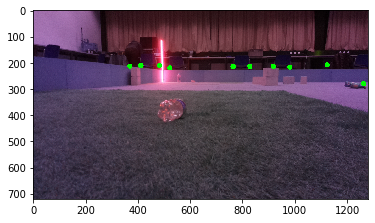

neighbours 1
neighbours 1
neighbours 2
neighbours 0
neighbours 0
neighbours 1
neighbours 2
neighbours 2
neighbours 2
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6681239604949951 seconds


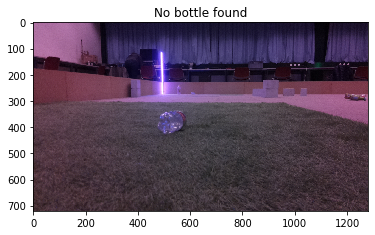

images/noIR/image17.jpg


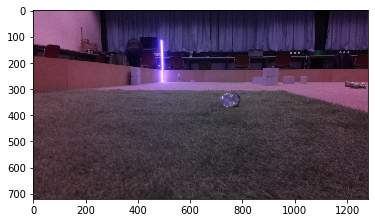

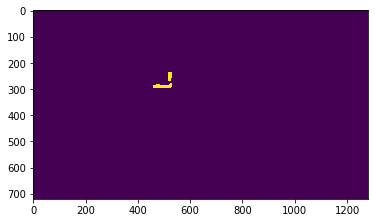

corners [[[ 764.  215.]]

 [[ 370.  213.]]

 [[ 413.  211.]]

 [[1124.  209.]]

 [[ 522.  220.]]

 [[ 767.  353.]]

 [[ 828.  214.]]

 [[1264.  280.]]

 [[ 483.  211.]]

 [[ 918.  214.]]]
detected corners


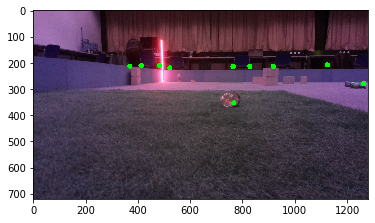

neighbours 1
neighbours 1
neighbours 2
neighbours 0
neighbours 1
neighbours 0
neighbours 2
neighbours 0
neighbours 2
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.60201096534729 seconds


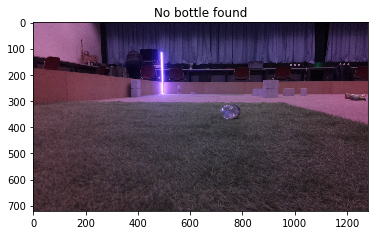

images/noIR/image18.jpg


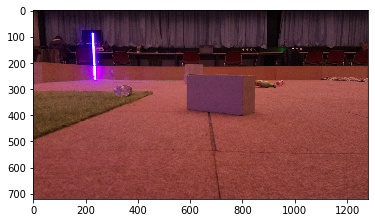

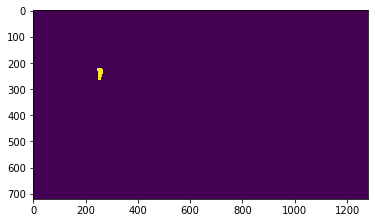

corners [[[ 572.  202.]]

 [[ 311.  204.]]

 [[ 240.  265.]]

 [[ 638.  202.]]

 [[ 797.  202.]]

 [[ 232.  213.]]

 [[1209.  202.]]

 [[ 234.  254.]]

 [[ 345.  292.]]

 [[ 938.  274.]]]
detected corners


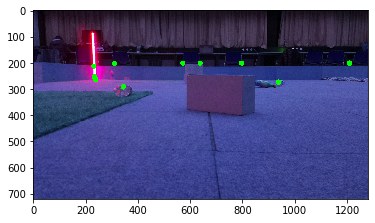

neighbours 1
neighbours 4
neighbours 3
neighbours 1
neighbours 0
neighbours 3
neighbours 0
neighbours 3
neighbours 1
neighbours 0
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6026198863983154 seconds


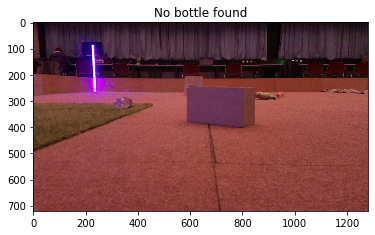

images/noIR/image19.jpg


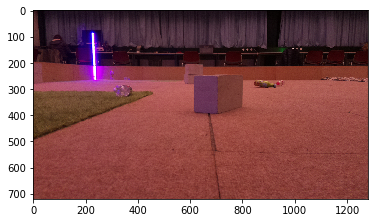

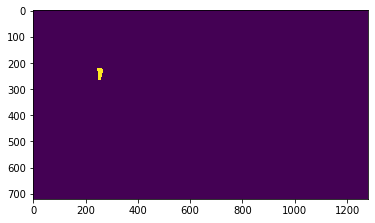

corners [[[ 311.  204.]]

 [[ 572.  202.]]

 [[ 638.  202.]]

 [[ 240.  265.]]

 [[ 797.  202.]]

 [[ 232.  213.]]

 [[ 234.  254.]]

 [[1209.  202.]]

 [[ 345.  292.]]

 [[ 333.  288.]]]
detected corners


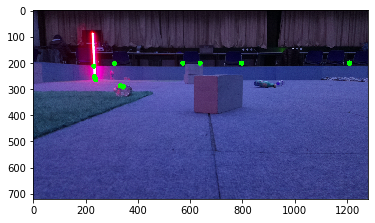

neighbours 5
neighbours 1
neighbours 1
neighbours 4
neighbours 0
neighbours 3
neighbours 3
neighbours 0
neighbours 2
neighbours 3
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.572180986404419 seconds


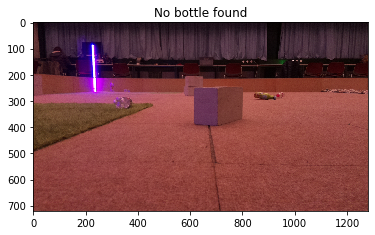

images/noIR/image20.jpg


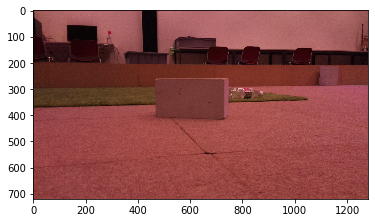

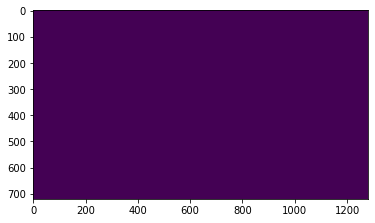

corners [[[ 766.  307.]]

 [[ 802.  301.]]

 [[ 862.  312.]]

 [[ 836.  330.]]

 [[ 758.  321.]]

 [[1056.  201.]]

 [[ 785.  301.]]

 [[1045.  206.]]

 [[ 735.  204.]]

 [[ 834.  309.]]]
detected corners


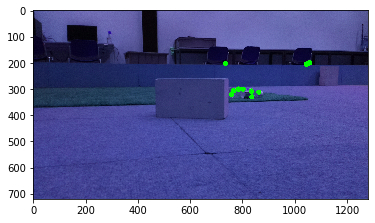

neighbours 6
neighbours 6
neighbours 5
neighbours 6
neighbours 5
neighbours 1
neighbours 6
neighbours 1
neighbours 0
neighbours 6
[DETECTION] Found a bottle at position  [801 315]
[DETECTION] detection time:  0.5990338325500488 seconds


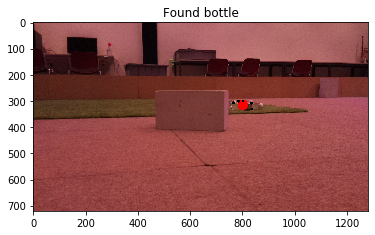

images/noIR/image21.jpg


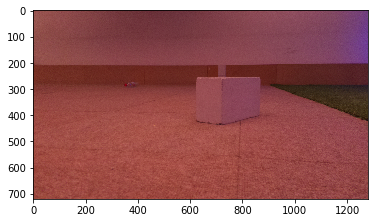

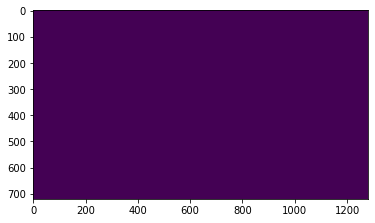

corners [[[ 366.  280.]]

 [[1162.  378.]]

 [[1211.  398.]]

 [[1256.  416.]]

 [[ 627.  260.]]

 [[ 962.  448.]]

 [[1033.  346.]]

 [[ 648.  426.]]

 [[ 854.  257.]]

 [[ 396.  278.]]]
detected corners


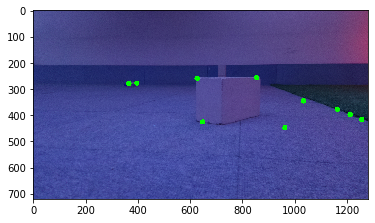

neighbours 1
neighbours 1
neighbours 2
neighbours 1
neighbours 0
neighbours 0
neighbours 0
neighbours 0
neighbours 0
neighbours 1
[DETECTION] Found no bottle ...
[DETECTION] detection time:  0.6110539436340332 seconds


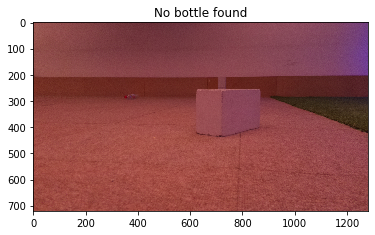

In [4]:
i = 1
while i < 22:
    img_name = "images/noIR/image"+str(i)+".jpg"
    print(img_name)
    plt.imshow(plt.imread(img_name))
    plt.show()
    img = cv.imread(img_name)
    #plt.imshow(img)
    #plt.show()
    has_bottle, center, img_out = detect_bottle(img)

    img_out = cv.cvtColor(img_out, cv.COLOR_BGR2RGB)

    plt.figure()
    if has_bottle:
        plt.title("Found bottle")
    else:
        plt.title("No bottle found")
    plt.imshow(img_out)
    plt.show()
    i += 1

In [4]:
queue = mp.Queue()
e_bottle = mp.Event()
Z = np.array([[2714/2, 0, 640], [0, 2714/2, 360], [0, 0, 1]])
Zi = np.linalg.inv(Z)
x_c = 640
y_c = 360
r2 = Zi.dot([x_c, y_c, 1.0])
filename = "images/noIR/image3.jpg"
q = detect_bottle(queue, e_bottle, Zi, r2, filename)
bottle_pos = q.get()
bottle_pos

neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 6
neighbours 7
neighbours 7
neighbours 7
neighbours 0
neighbours 0
[DETECTION] Found a bottle at position  [ 62 340] bottle position [0.8        0.40288195]
center bottle: [ 62 340]


array([0.8       , 0.40288195])

In [5]:
bottle_pos[0]

0.8

In [6]:
bottle_pos[1]

0.40288195247948